# Prep

In [2]:
# !wget https://mcauleylab.ucsd.edu/public_datasets/gdrive/goodreads/goodreads_reviews_spoiler_raw.json.gz
# !wget --no-check-certificate https://mcauleylab.ucsd.edu/public_datasets/gdrive/goodreads/goodreads_book_genres_initial.json.gz
# # Now we have goodreads_book_genres_initial.json.gz and goodreads_reviews_spoiler_raw.json.gz in our dir
# # Let's extract the data from these files
# !gunzip goodreads_book_genres_initial.json.gz
# !gunzip goodreads_reviews_spoiler_raw.json.gz

In [3]:
import gzip
import json
import re
import os
import sys
import numpy as np
import pandas as pd

In [4]:
# Now that we have the jsons extracted, let's count entries in each file
def count_entries(file):
    count = 0
    with open(file) as f:
        for line in f:
            count += 1
    return count

print("Entries in goodreads_book_genres_initial.json: ", count_entries("goodreads_book_genres_initial.json"))
print("Entries in goodreads_reviews_spoiler_raw.json: ", count_entries("goodreads_reviews_spoiler_raw.json"))

Entries in goodreads_book_genres_initial.json:  2360655
Entries in goodreads_reviews_spoiler_raw.json:  1378033


In [5]:
# Read to pandas dfs
reviews = pd.read_json("goodreads_reviews_spoiler_raw.json", lines=True)
books = pd.read_json("goodreads_book_genres_initial.json", lines=True)

In [6]:
print(reviews.head())

                            user_id   book_id  \
0  8842281e1d1347389f2ab93d60773d4d  18245960   
1  8842281e1d1347389f2ab93d60773d4d     16981   
2  8842281e1d1347389f2ab93d60773d4d  28684704   
3  8842281e1d1347389f2ab93d60773d4d  27161156   
4  8842281e1d1347389f2ab93d60773d4d  25884323   

                          review_id  rating  \
0  dfdbb7b0eb5a7e4c26d59a937e2e5feb       5   
1  a5d2c3628987712d0e05c4f90798eb67       3   
2  2ede853b14dc4583f96cf5d120af636f       3   
3  ced5675e55cd9d38a524743f5c40996e       0   
4  332732725863131279a8e345b63ac33e       4   

                                         review_text  \
0  This is a special book. It started slow for ab...   
1  Recommended by Don Katz. Avail for free in Dec...   
2  A fun, fast paced science fiction thriller. I ...   
3  Recommended reading to understand what is goin...   
4  I really enjoyed this book, and there is a lot...   

                       date_added                    date_updated  \
0  Sun Jul 30 07

In [7]:
# Drop from reviews:
# user_id, review_id, date_added, date_updated, read_at, started_at, n_comments
reviews.drop(columns=["user_id", "review_id", "date_added", "date_updated", "read_at", "started_at", "n_comments"], inplace=True)
print(reviews.head())

    book_id  rating                                        review_text  \
0  18245960       5  This is a special book. It started slow for ab...   
1     16981       3  Recommended by Don Katz. Avail for free in Dec...   
2  28684704       3  A fun, fast paced science fiction thriller. I ...   
3  27161156       0  Recommended reading to understand what is goin...   
4  25884323       4  I really enjoyed this book, and there is a lot...   

   n_votes  
0       28  
1        1  
2       22  
3        5  
4        9  


In [8]:
print(books.head())
print(books["genres"][5])

   book_id                                             genres
0  5333265      {'history, historical fiction, biography': 1}
1  1333909  {'fiction': 219, 'history, historical fiction,...
2  7327624  {'fantasy, paranormal': 31, 'fiction': 8, 'mys...
3  6066819  {'fiction': 555, 'romance': 23, 'mystery, thri...
4   287140                                 {'non-fiction': 3}
{'history, historical fiction, biography': 9, 'children': 6, 'fantasy, paranormal': 1, 'fiction': 1, 'young-adult': 1}


In [9]:
def parse_genres(genre_dict):
    """Extract genres from dictionary, splitting any comma-separated genres"""
    if not isinstance(genre_dict, dict):
        return []
    
    all_genres = []
    for genre_group in genre_dict.keys():
        # Split comma-separated genres and strip whitespace
        individual_genres = [g.strip() for g in genre_group.split(',')]
        all_genres.extend(individual_genres)
    
    return all_genres

# Create new column with parsed genres
books['parsed_genres'] = books['genres'].apply(parse_genres)

# Show example
print(books[['genres', 'parsed_genres']].iloc[5])

genres           {'history, historical fiction, biography': 9, ...
parsed_genres    [history, historical fiction, biography, child...
Name: 5, dtype: object


In [10]:
# Now that we successfully parsed, drop the existing genres col and rename the new one to genres
books.drop(columns=["genres"], inplace=True)
books.rename(columns={"parsed_genres": "genres"}, inplace=True)
print(books.head())

   book_id                                             genres
0  5333265           [history, historical fiction, biography]
1  1333909  [fiction, history, historical fiction, biography]
2  7327624  [fantasy, paranormal, fiction, mystery, thrill...
3  6066819       [fiction, romance, mystery, thriller, crime]
4   287140                                      [non-fiction]


# Exploratory Analysis
## Goals:
- Bar graph of distribution of ratings
- Rating vs review text word count scatter plot
- Average rating of each genre graph
- Top words (TFIDF) to get most important words for each genre
- Top words per rating
- Word cloud of most common words in reviews per genre
- Word cloud of words by rating

### Bar Graph Distribution Ratings

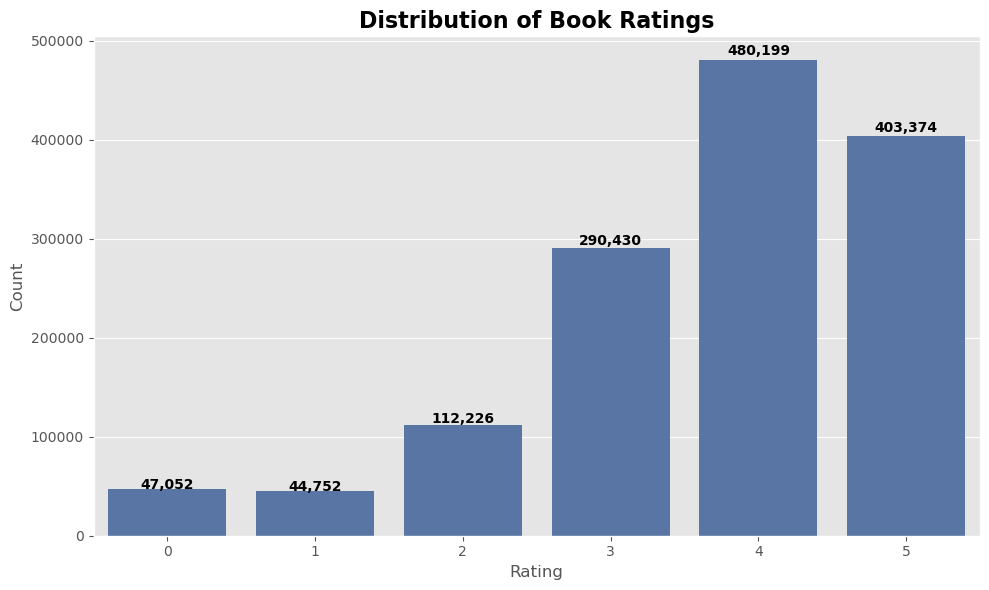

Total reviews: 1378033
Rating distribution percentage:
Rating 0: 3.41%
Rating 1: 3.25%
Rating 2: 8.14%
Rating 3: 21.08%
Rating 4: 34.85%
Rating 5: 29.27%


In [11]:
# Import visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns

# Set the style for better visualization
plt.style.use('ggplot')
sns.set_palette("deep")

# Count the occurrences of each rating
rating_counts = reviews['rating'].value_counts().sort_index()

# Create figure with appropriate size
plt.figure(figsize=(10, 6))

# Create bar plot
ax = sns.barplot(x=rating_counts.index, y=rating_counts.values)

# Add value labels on top of each bar
for i, count in enumerate(rating_counts.values):
    ax.text(i, count + (count*0.01), f'{count:,}', ha='center', fontweight='bold')

# Add titles and labels
plt.title('Distribution of Book Ratings', fontsize=16, fontweight='bold')
plt.xlabel('Rating', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Adjust layout and display
plt.tight_layout()
plt.show()

# Print some statistics about ratings
print(f"Total reviews: {len(reviews)}")
print(f"Rating distribution percentage:")
for rating, count in rating_counts.items():
    print(f"Rating {rating}: {count/len(reviews)*100:.2f}%")

In [12]:
# Print out a sample of reviews where the rating is 0
print(reviews[reviews['rating'] == 0].sample(5))

          book_id  rating                                        review_text  \
798759      38447       0                                         No thanks.   
1220213   7932146       0  From the very first pages, I was hooked. I rea...   
815645   16002011       0  Best author bio ever: "Prudence Shen is a writ...   
651640    6289283       0  Fascinating subject matter, and very curious a...   
421751    1268479       0  https://twitter.com/neiljosten/status... lost ...   

         n_votes  
798759         0  
1220213        0  
815645         0  
651640         0  
421751         3  


In [13]:
# Drop the ratings where rating is 0 as they're DNFs and not useful to us
reviews = reviews[reviews['rating'] != 0]

### Rating vs Review Text Word Count

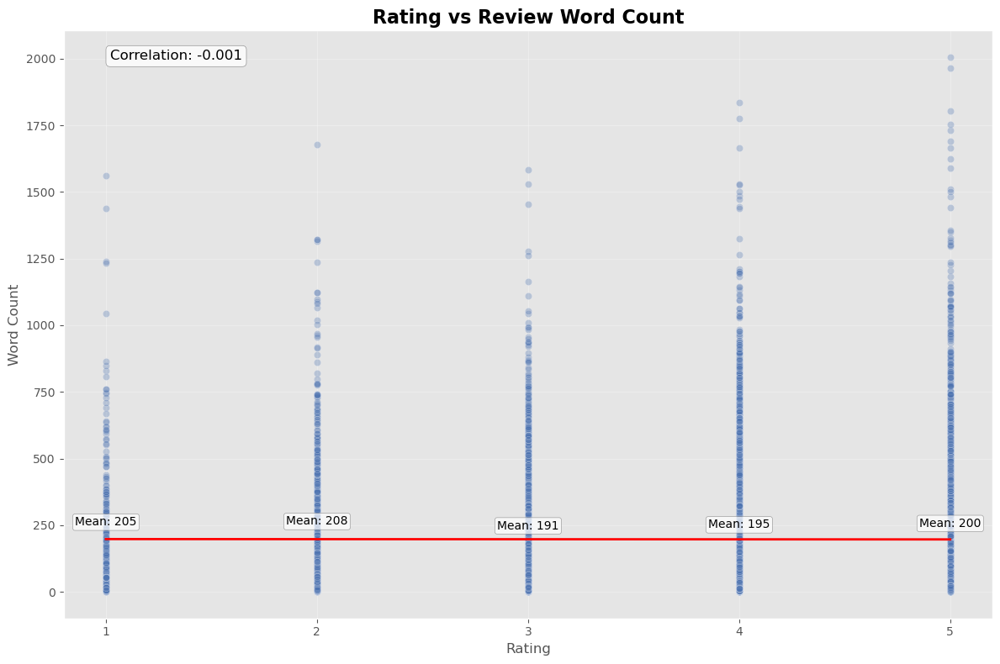

Word count statistics by rating:
Rating 1: Mean=205.1, Median=106.0, Min=1, Max=3004
Rating 2: Mean=207.7, Median=124.0, Min=1, Max=3023
Rating 3: Mean=191.4, Median=115.0, Min=1, Max=2879
Rating 4: Mean=195.2, Median=115.0, Min=1, Max=3493
Rating 5: Mean=200.3, Median=109.0, Min=1, Max=3400


In [14]:
# Set the style for better visualization
plt.style.use('ggplot')
sns.set_palette("deep")

# Calculate word count for each review
reviews['word_count'] = reviews['review_text'].apply(lambda x: len(str(x).split()))

# Create figure with appropriate size
plt.figure(figsize=(12, 8))

# Sample data to prevent overcrowding in the plot
# (plotting all points would be too dense and slow)
sample_size = min(10000, len(reviews))
reviews_sample = reviews.sample(sample_size, random_state=42)

# Create scatter plot with transparency to see density
ax = sns.scatterplot(x='rating', y='word_count', data=reviews_sample, alpha=0.3)

# Add a trend line to show relationship
sns.regplot(x='rating', y='word_count', data=reviews, scatter=False, 
            color='red', line_kws={'linewidth': 2})

# Add labels and title
plt.title('Rating vs Review Word Count', fontsize=16, fontweight='bold')
plt.xlabel('Rating', fontsize=12)
plt.ylabel('Word Count', fontsize=12)

# Set x-axis to show ratings as discrete values
plt.xticks([1, 2, 3, 4, 5])

# Calculate and display correlation coefficient
correlation = reviews[['rating', 'word_count']].corr().iloc[0, 1]
plt.annotate(f'Correlation: {correlation:.3f}', 
             xy=(0.05, 0.95), xycoords='axes fraction', 
             fontsize=12, bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="gray", alpha=0.8))

# Calculate mean word count by rating and add to plot
mean_counts = reviews.groupby('rating')['word_count'].mean()
for rating, mean_count in mean_counts.items():
    plt.annotate(f'Mean: {mean_count:.0f}', 
                 xy=(rating, mean_count), 
                 xytext=(0, 10), textcoords='offset points',
                 ha='center', fontsize=10,
                 bbox=dict(boxstyle="round,pad=0.2", fc="white", ec="gray", alpha=0.7))

# Add grid for better readability
plt.grid(True, alpha=0.3)

# Tight layout for better spacing
plt.tight_layout()

# Show plot
plt.show()

# Print some statistics about word counts by rating
print("Word count statistics by rating:")
for rating, group in reviews.groupby('rating'):
    print(f"Rating {rating}: Mean={group['word_count'].mean():.1f}, Median={group['word_count'].median()}, Min={group['word_count'].min()}, Max={group['word_count'].max()}")

### Average Rating per Genre

In [15]:
# First, merge the reviews and books DataFrames on book_id
merged_data = pd.merge(reviews, books, on='book_id', how='inner')

# Since genres are in lists, we need to explode the data to have one genre per row
exploded_data = merged_data.explode('genres')

# Group by genre and calculate the average rating
genre_ratings = exploded_data.groupby('genres')['rating'].agg(['mean', 'count']).reset_index()

# Sort by the average rating in descending order (no filtering)
genre_ratings = genre_ratings.sort_values('mean', ascending=False)

print(genre_ratings.head())

      genres      mean    count
1   children  3.921242   110516
2     comics  3.888680    69592
6    graphic  3.888680    69592
12    poetry  3.844289    13737
13   romance  3.826419  1007386


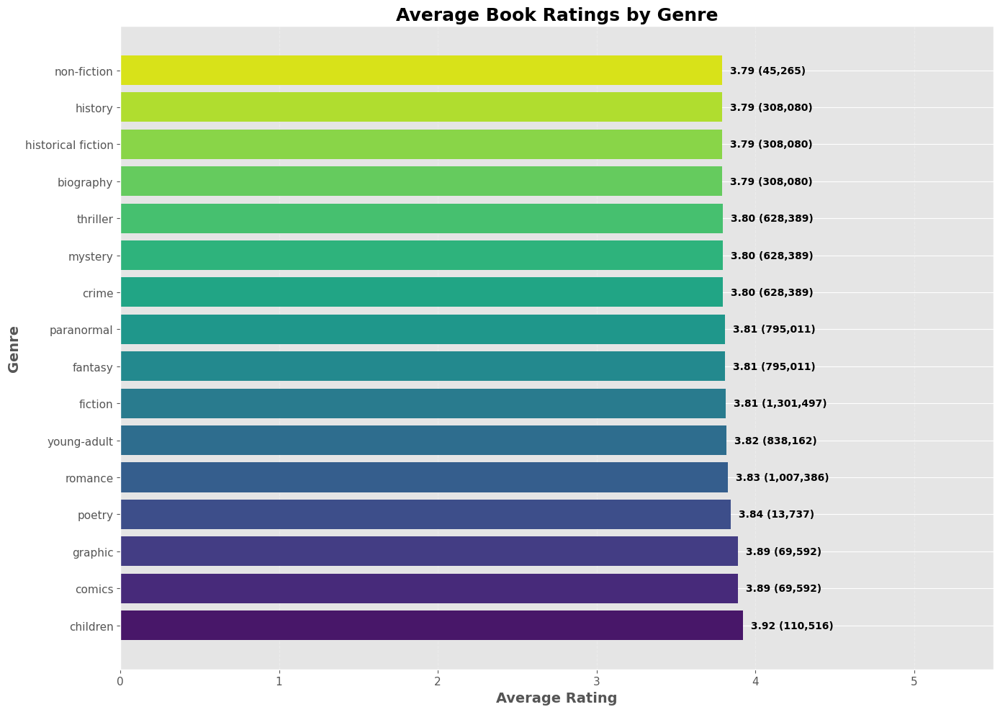

Number of genres: 16
Genre with highest average rating: children (3.92)
Genre with lowest average rating: non-fiction (3.79)
Standard deviation of ratings by genre:
0.04131332961479834


In [ ]:
# Create a figure with appropriate size
plt.figure(figsize=(14, 10))

# Use a Seaborn color palette
palette = sns.color_palette("viridis", n_colors=len(genre_ratings))

# Create bar plot for average ratings by genre with different colors from the palette
bars = plt.barh(genre_ratings['genres'], genre_ratings['mean'], color=palette)

# Add values on the bars with better formatting
for i, bar in enumerate(bars):
    plt.text(bar.get_width() + 0.05, 
             bar.get_y() + bar.get_height()/2, 
             f'{genre_ratings["mean"].iloc[i]:.2f} ({genre_ratings["count"].iloc[i]:,})', 
             va='center',
             fontweight='bold',
             color='black')

# Set labels and title with improved styling
plt.xlabel('Average Rating', fontsize=14, fontweight='bold')
plt.ylabel('Genre', fontsize=14, fontweight='bold')
plt.title('Average Book Ratings by Genre', fontsize=18, fontweight='bold')
plt.xlim(0, 5.5)
plt.grid(axis='x', linestyle='--', alpha=0.3)

# Style the tick labels
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)

# Adjust layout and display
plt.tight_layout()
plt.show()

# Print some statistics about the genre ratings
print(f"Number of genres: {len(genre_ratings)}")
print(f"Genre with highest average rating: {genre_ratings.iloc[0]['genres']} ({genre_ratings.iloc[0]['mean']:.2f})")
print(f"Genre with lowest average rating: {genre_ratings.iloc[-1]['genres']} ({genre_ratings.iloc[-1]['mean']:.2f})")

# Print standard deviation of ratings by genre
print("Standard deviation of all ratings:")

# Export Data


In [17]:
# # Export a random sample of 20000 reviews to CSV
# reviews_sample = reviews.sample(20000, random_state=42)
# reviews_sample.to_csv('goodreads_reviews_sample.csv', index=False)

### Top Words and Word Clouds for Selected Genres
- Genres: crime, fantasy, romance, poetry, comics
- Print top 10 words for each genre
- Word cloud of most common words in reviews per genre

In [18]:
import re
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from collections import Counter
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import TfidfVectorizer
from tqdm.notebook import tqdm  # Import tqdm for progress bars in notebooks

# Download necessary NLTK data
nltk.download('punkt')
nltk.download('punkt_tab')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to /home/default/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to
[nltk_data]     /home/default/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /home/default/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [19]:
# Function to clean and preprocess text
def clean_text(text):
    if isinstance(text, str):
        # Convert to lowercase
        text = text.lower()
        # Remove special characters and digits
        text = re.sub(r'[^a-zA-Z\s]', '', text)
        # Tokenize
        tokens = word_tokenize(text)
        # Remove stopwords
        stop_words = set(stopwords.words('english'))
        tokens = [word for word in tokens if word not in stop_words and len(word) > 2]
        return tokens
    return []

# Select our genres of interest
selected_genres = ['crime', 'fantasy', 'romance', 'poetry', 'comics']

# Create a dictionary to store reviews by genre
genre_reviews = {genre: [] for genre in selected_genres}

# Filter the merged data for each genre and collect reviews
for genre in selected_genres:
    genre_data = exploded_data[exploded_data['genres'] == genre]
    genre_reviews[genre] = genre_data['review_text'].tolist()

In [20]:

# Process all reviews and extract words by genre (limited to 100,000 reviews per genre)
MAX_REVIEWS_PER_GENRE = 100000
genre_words = {}

print("Processing reviews by genre:")
for genre, reviews in genre_reviews.items():
    all_words = []
    # Limit the number of reviews to process
    limited_reviews = reviews[:MAX_REVIEWS_PER_GENRE]
    total_reviews = len(limited_reviews)
    
    print(f"\nProcessing {genre} reviews ({total_reviews} out of {len(reviews)} total)")
    
    # Process in batches and print progress
    batch_size = max(1, total_reviews // 10)  # Print progress 10 times
    for i, review in enumerate(limited_reviews):
        clean_words = clean_text(review)
        all_words.extend(clean_words)
        
        # Print progress update
        if (i+1) % batch_size == 0 or i+1 == total_reviews:
            progress = (i+1) / total_reviews * 100
            print(f"Progress: {progress:.1f}% ({i+1}/{total_reviews})", end='\r')
    
    # Store the words for this genre in the dictionary
    genre_words[genre] = all_words
    print(f"\n✓ Extracted {len(all_words)} words from {genre} reviews")

Processing reviews by genre:

Processing crime reviews (100000 out of 628389 total)
Progress: 100.0% (100000/100000)
✓ Extracted 9156539 words from crime reviews

Processing fantasy reviews (100000 out of 795011 total)
Progress: 100.0% (100000/100000)
✓ Extracted 8798616 words from fantasy reviews

Processing romance reviews (100000 out of 1007386 total)


KeyboardInterrupt: 

In [ ]:
# Prepare documents for TF-IDF (one document = all reviews for a genre)
genre_texts = {}
for genre, reviews in genre_reviews.items():
    genre_texts[genre] = ' '.join(reviews)

# Create a list of documents
documents = list(genre_texts.values())
genres = list(genre_texts.keys())

# Create TF-IDF vectorizer
tfidf_vectorizer = TfidfVectorizer(max_features=1000, stop_words='english')
tfidf_matrix = tfidf_vectorizer.fit_transform(documents)
feature_names = tfidf_vectorizer.get_feature_names_out()

# Get top TF-IDF words for each genre
tfidf_top_words = {}
for i, genre in enumerate(genres):
    tfidf_scores = zip(feature_names, tfidf_matrix[i].toarray()[0])
    tfidf_scores = sorted(tfidf_scores, key=lambda x: x[1], reverse=True)
    tfidf_top_words[genre] = tfidf_scores

# # Print top TF-IDF words
# for genre, word_scores in tfidf_top_words.items():
#     print(f"\nTop 10 distinctive words for {genre.upper()} genre (TF-IDF):")
#     for i, (word, score) in enumerate(word_scores, 1):
#         print(f"{i}. {word}: {score:.4f}")

AttributeError: 'list' object has no attribute 'items'

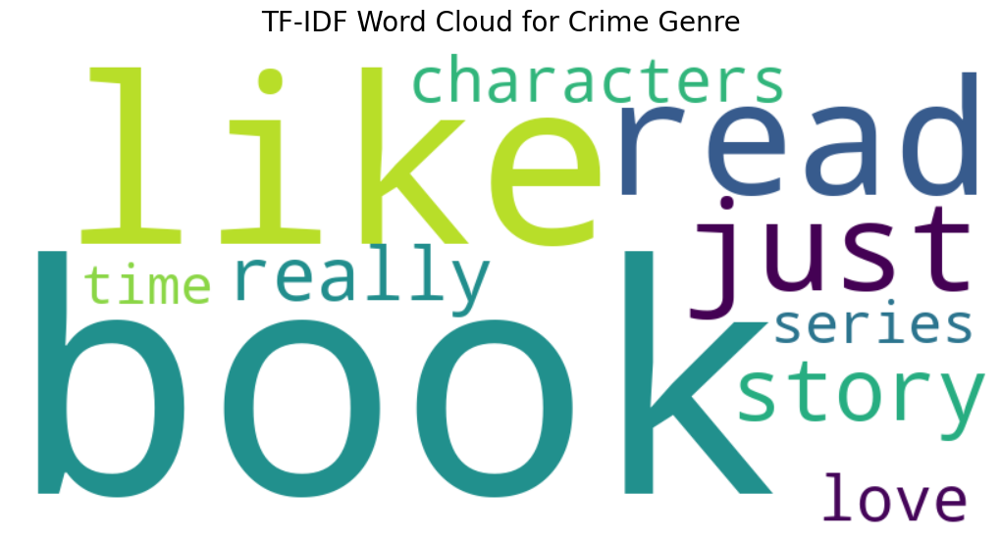

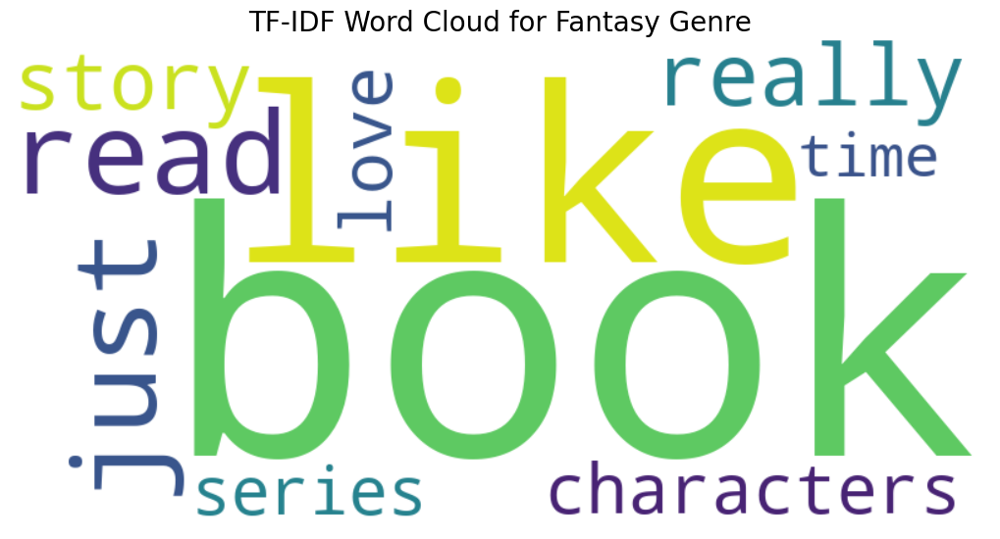

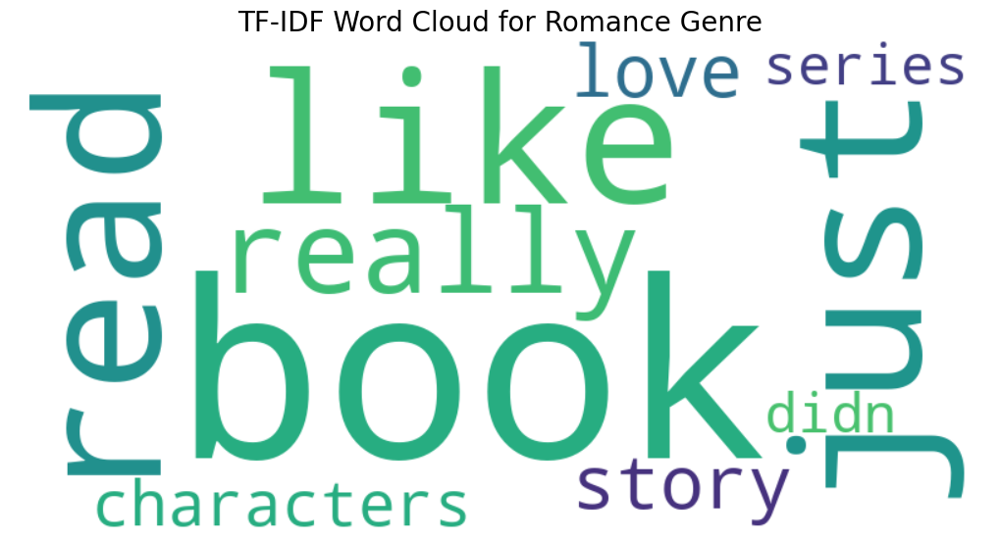

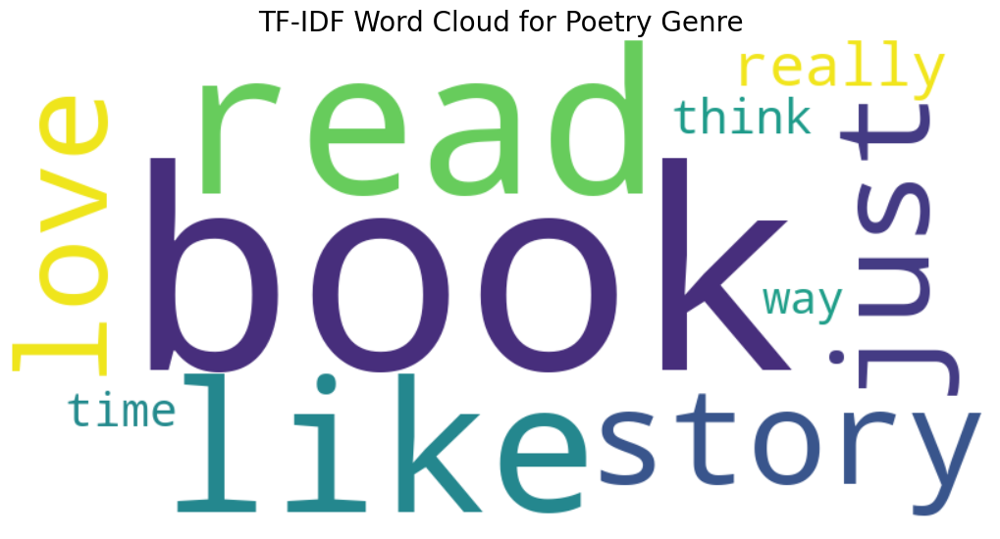

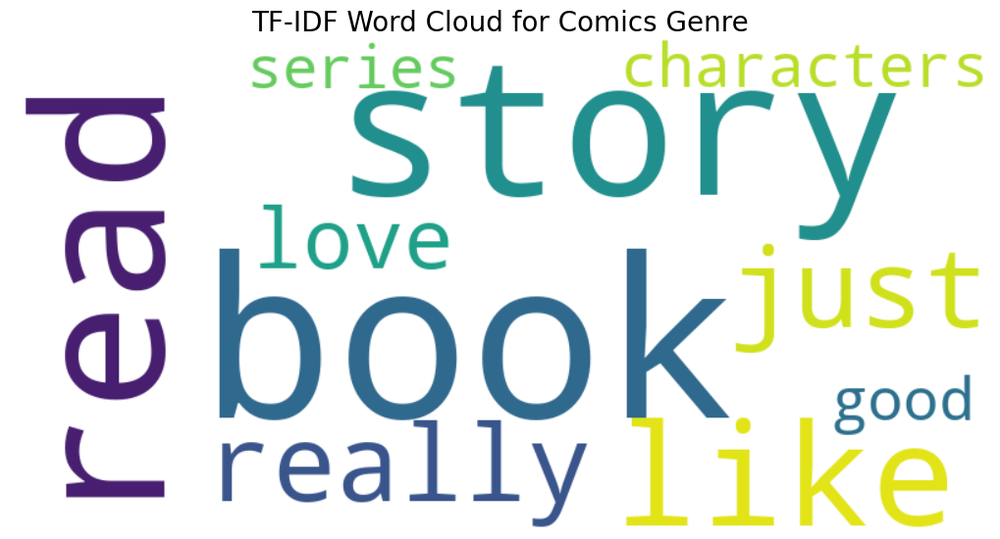

In [ ]:
# Generate word clouds based on TF-IDF scores
for genre, word_scores in tfidf_top_words.items():
    # Create a dictionary of words and their TF-IDF scores
    word_dict = {word: score for word, score in word_scores[:50]}  # Use top 50 words
    
    # Generate word cloud
    wordcloud = WordCloud(width=800, height=400, 
                         background_color='white',
                         contour_width=3,
                         contour_color='steelblue')
    wordcloud.generate_from_frequencies(word_dict)
    
    # Display the word cloud
    plt.figure(figsize=(10, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'TF-IDF Word Cloud for {genre.capitalize()} Genre', fontsize=20)
    plt.tight_layout(pad=0)
    plt.show()

# Overall Word Cloud

Total reviews available: 2,514,115
Sampling 250,000 random reviews from the dataset...
Successfully sampled 250,000 reviews
Processing sampled reviews...
Progress: 100.0% (250,000/250,000)
✓ Processing complete
Generating word cloud...


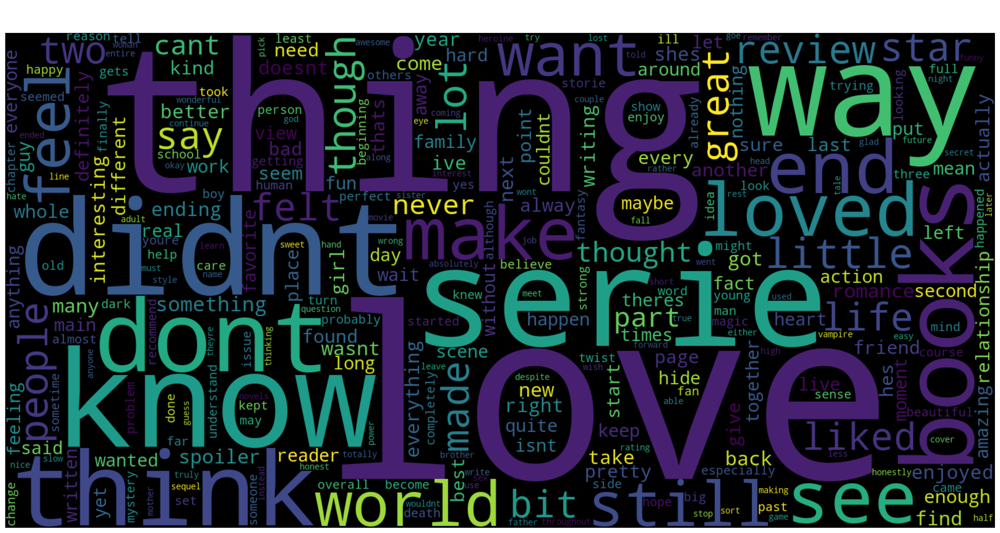

Word cloud saved to book_reviews_wordcloud.png


In [ ]:
import numpy as np
import random
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import re

# Get all reviews from our genre dictionary
all_reviews = []
for genre, genre_reviews in genre_reviews.items():
    all_reviews.extend(genre_reviews)

# Sample 250,000 random reviews from the combined list
SAMPLE_SIZE = 250000
print(f"Total reviews available: {len(all_reviews):,}")
print(f"Sampling {SAMPLE_SIZE:,} random reviews from the dataset...")

# Use random sampling for lists
if len(all_reviews) > SAMPLE_SIZE:
    sampled_reviews = random.sample(all_reviews, SAMPLE_SIZE)
else:
    sampled_reviews = all_reviews
print(f"Successfully sampled {len(sampled_reviews):,} reviews")

# Process the reviews to extract clean words
print("Processing sampled reviews...")
all_words = []
batch_size = max(1, len(sampled_reviews) // 20)  # Show progress 20 times

# Extend stop words with book review specific terms
additional_stopwords = ['book', 'read', 'story', 'author', 'character', 'novel', 'time', 
                       'would', 'reading', 'plot', 'really', 'characters', 'like', 
                       'good', 'one', 'even', 'much', 'well', 'going', 'first']
stop_words = set(stopwords.words('english') + additional_stopwords)

# Define a more thorough cleaning function
def clean_text_for_wordcloud(text):
    if not isinstance(text, str):
        return ""
    # Convert to lowercase
    text = text.lower()
    # Remove special characters and digits
    text = re.sub(r'[^a-zA-Z\s]', '', text)
    # Tokenize
    tokens = word_tokenize(text)
    # Remove stopwords and short words
    cleaned = [word for word in tokens if word not in stop_words and len(word) > 2]
    # Return as space-separated string for word cloud
    return " ".join(cleaned)

# Process reviews with progress tracking
cleaned_text = ""
for i, review in enumerate(sampled_reviews):
    cleaned_text += clean_text_for_wordcloud(review) + " "
    
    # Show progress
    if (i+1) % batch_size == 0 or i+1 == len(sampled_reviews):
        progress = (i+1) / len(sampled_reviews) * 100
        print(f"Progress: {progress:.1f}% ({i+1:,}/{len(sampled_reviews):,})", end='\r')

print("\n✓ Processing complete")


Generating word cloud...


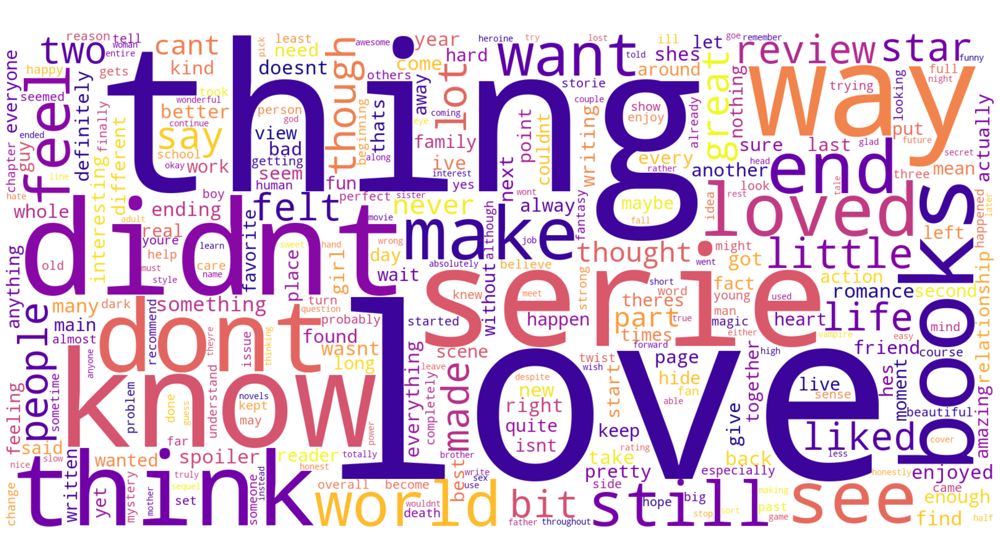

Word cloud saved to book_reviews_wordcloud.png


In [ ]:
# Create a large, visually appealing word cloud
print("Generating word cloud...")
wordcloud = WordCloud(
    width=1600, 
    height=800,
    background_color='white',
    colormap='plasma',
    max_words=300,
    contour_width=3,
    contour_color='steelblue',
    collocations=False,  # Avoid repeating word pairs
    random_state=42
).generate(cleaned_text)

# Display the word cloud with high resolution
plt.figure(figsize=(20, 10), dpi=300)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Book Reviews Word Cloud (250,000 Random Reviews)', fontsize=24, color='white', pad=20)
plt.tight_layout(pad=0)

# Save the wordcloud as a high resolution image
wordcloud_path = 'book_reviews_wordcloud.png'
plt.savefig(wordcloud_path, bbox_inches='tight', dpi=300, facecolor='black')
plt.show()

print(f"Word cloud saved to {wordcloud_path}")

# Modeling

In [ ]:
# # use bag of words model to vectorize the reviews
# from sklearn.feature_extraction.text import CountVectorizer
# from sklearn.model_selection import train_test_split
# from sklearn.linear_model import LogisticRegression
# from sklearn.metrics import accuracy_score, classification_report

# # Split the data into training and testing sets
# X_train, X_test, y_train, y_test = train_test_split(df['review'], df['rating'], test_size=0.2, random_state=42)

# # Vectorize the reviews
# vectorizer = CountVectorizer(max_features=5000, stop_words='english')

# X_train_bow = vectorizer.fit_transform(X_train)
# X_test_bow = vectorizer.transform(X_test)
# # Train a logistic regression model
# model = LogisticRegression(max_iter=1000)
# model.fit(X_train_bow, y_train)

# # Make predictions on the testing set
# y_pred = model.predict(X_test_bow)
# # Evaluate the model
# print("Accuracy:", accuracy_score(y_test, y_pred))
# print("Classification Report:\n", classification_report(y_test, y_pred))

# # print out the confusion matrix
# from sklearn.metrics import confusion_matrix
# import seaborn as sns
# import matplotlib.pyplot as plt

# cm = confusion_matrix(y_test, y_pred)
# sns.heatmap(cm, annot=True, fmt='d')
# plt.xlabel('Predicted')
# plt.ylabel('Actual')
# plt.show()



# BERT

In [ ]:
# import torch
# from sklearn.model_selection import train_test_split
# from transformers import BertTokenizer, BertForSequenceClassification, Trainer, TrainingArguments


# Final Analysis and Comparison
- Bar plot of our predictions vs actual ratings
- Top 20 words in training set vs testing set